In [1]:


 import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
import tensorflow as tf
from tensorflow.keras import models,layers

In [38]:
IMAGE_SIZE=256
BATCH_SIZE=32
CHANNELS=3
EPOCHS=20

In [4]:
#load all images into tensors(data sets)

data_set=tf.keras.preprocessing.image_dataset_from_directory(
    'D:\data science projects\potato disease project\potato_data',
    shuffle=True,
    
    
    
    
    
    
    
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
    
)

Found 2152 files belonging to 3 classes.


In [84]:
class_names=data_set.class_names

In [85]:
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [7]:
len(data_set)       # len(data_set) * BATCH_SIZE

68

In [8]:
for image_batch, label_batch in data_set.take(1):
    print(image_batch.shape)                              # print(image_batch[0]) --> tensor
    print(label_batch.numpy())                            # print(image_batch[0].numpy())  --> tensor into 3d array
     
  # plt.imshow(image_batch[0].numpy().astype('uint8'))
  # plt.title(class_names[label_batch[0]])
  # plt.show()                                            #plt.axis('off') --> off axis_numbers

(32, 256, 256, 3)
[0 0 1 0 0 1 0 0 0 0 0 1 0 1 1 1 0 1 1 2 0 1 0 0 1 0 0 1 1 0 0 1]


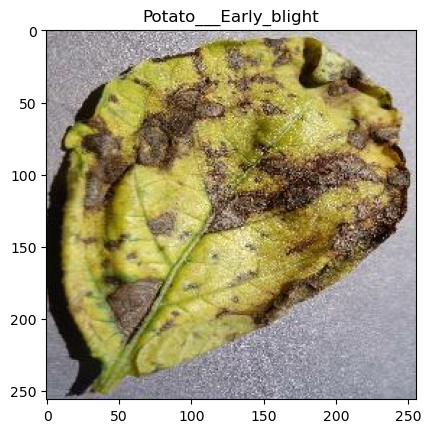

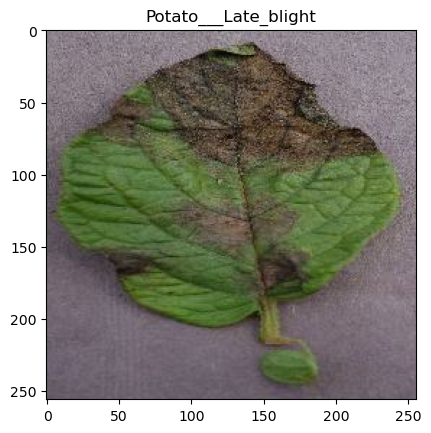

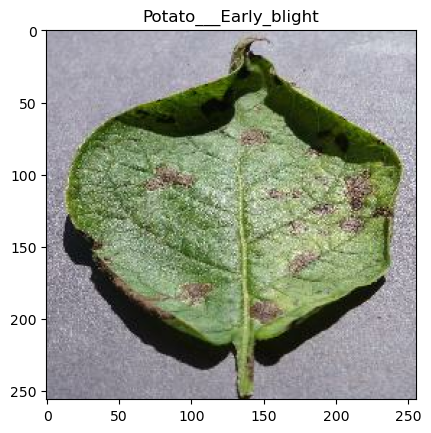

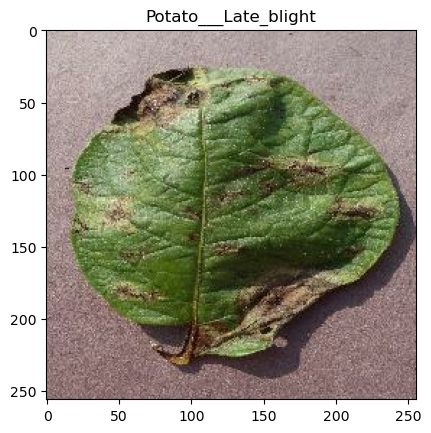

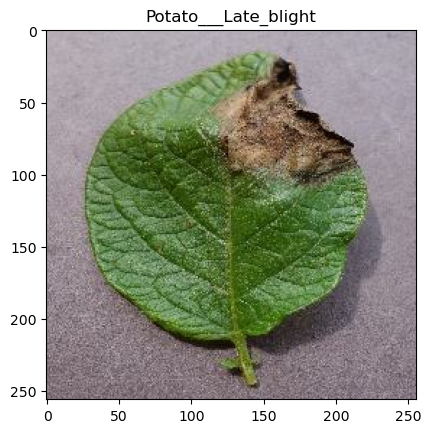

...

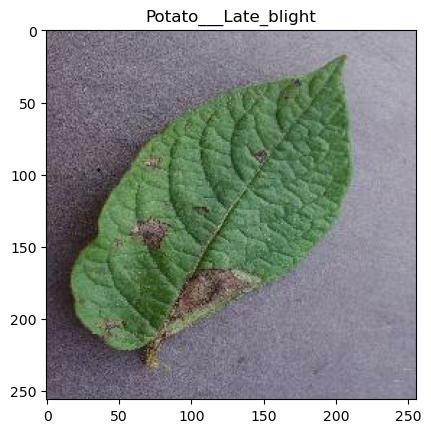

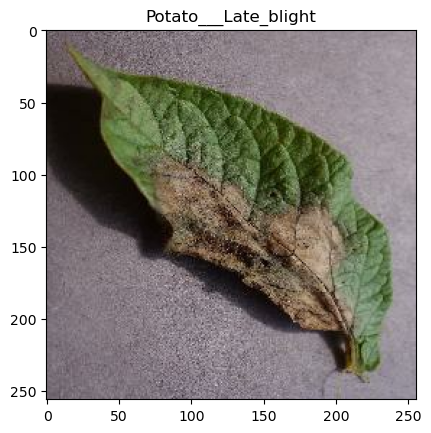

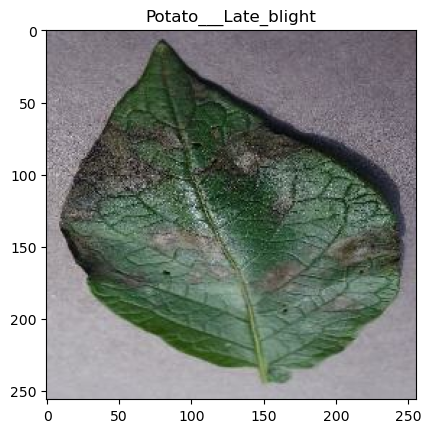

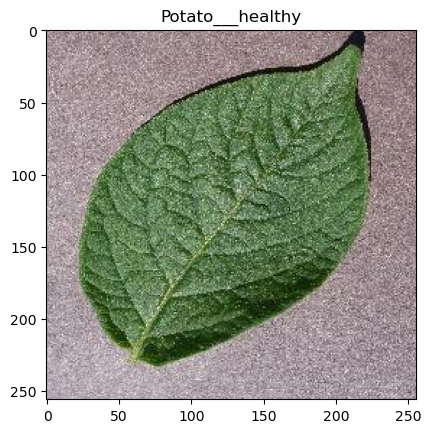

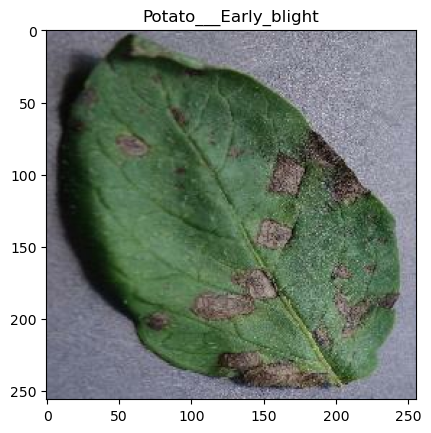

In [9]:
for image_batch, label_batch in data_set.take(1):
    for i in range(BATCH_SIZE):
        plt.subplot() 
        plt.imshow(image_batch[i].numpy().astype('uint8'))
        plt.title(class_names[label_batch[i]])
        plt.show()
    

In [10]:
train_size=0.8     # 80 % train, 20% --> 10% test 10% val

len(data_set)*train_size

54.400000000000006

In [11]:
train_ds=data_set.take(54)

In [12]:
test_ds=data_set.skip(54)
len(test_ds)

14

In [13]:
val_size=0.1

len(data_set)*val_size

6.800000000000001

In [14]:
val_ds = test_ds.take(6)

In [15]:
test_ds = test_ds.skip(6) 

len(test_ds)

8

In [16]:
len(ds)

NameError: name 'ds' is not defined

In [25]:
def data_set_partition_tf(ds,train_split=0.8,val_split=0.1,test_split=0.1,shuffle=True,shuffle_size=10000):
    
    ds_size=len(ds)
    if shuffle:
        ds=ds.shuffle(shuffle_size,seed=12)
        
    train_size=int(train_split*ds_size)
    val_size=int(val_split*ds_size)
    
    train_ds=ds.take(train_size)
    
    val_ds=ds.skip(train_size).take(val_size)
    test_ds=ds.skip(train_size).skip(val_size)
    
    return train_ds,val_ds,test_ds


In [26]:
train_ds,val_ds,test_ds=data_set_partition_tf(data_set)

In [29]:
# cache() will read the image from desk & next iteration when u we need this image it will keep that in memory, improve perfomence
# prepatch() if we are using gpu & cpu if gpu is busy to training prepatch will load next set of batch from desk

train_ds=train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds=val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds=test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)


In [35]:
# IF A IMAGE IS SOME DIFFERENT DIMENSION THIS LAYER TAKE CARE OF RESIZING IT (INT0 256,256)


resize_and_rescale=tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE,IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1.0/255)
])

In [36]:
# augmentation helps to create some new samples like horizontal,contrast, rotation,zoom.(to make the model robust)

data_augmentatioin=tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip('horizontal_and_vertical'),
    layers.experimental.preprocessing.RandomRotation(0.2)
])

In [42]:
# kernel_size = size of filter, 

input_shape=(BATCH_SIZE,IMAGE_SIZE,IMAGE_SIZE,CHANNELS)
n_classes=3


model=models.Sequential([  
    resize_and_rescale,
    data_augmentatioin,
    layers.Conv2D(filters=32,kernel_size=(3,3),activation='relu',input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(filters=64,kernel_size=(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(filters=64,kernel_size=(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(filters=64,kernel_size=(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(filters=64,kernel_size=(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(64,activation='relu'),
    layers.Dense(n_classes,activation='softmax')
])
model.build(input_shape=input_shape)

In [43]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_2 (Sequential)    (32, 256, 256, 3)         0         
_________________________________________________________________
sequential_3 (Sequential)    (32, 256, 256, 3)         0         
_________________________________________________________________
conv2d_13 (Conv2D)           (32, 254, 254, 32)        896       
_________________________________________________________________
max_pooling2d_13 (MaxPooling (32, 127, 127, 32)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (32, 125, 125, 64)        18496     
_________________________________________________________________
max_pooling2d_14 (MaxPooling (32, 62, 62, 64)          0         
_________________________________________________________________
conv2d_15 (Conv2D)           (32, 60, 60, 64)         

In [44]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [45]:
history=model.fit(
    train_ds,
    
    
     
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    verbose=1,
    validation_data=val_ds
)

Epoch 1/20
54/54 [==============================] - 432s 7s/step - loss: 0.7868 - accuracy: 0.6140 - val_loss: 0.6003 - val_accuracy: 0.77609s - loss: 0.7931 - accuracy: 0
Epoch 2/20
54/54 [==============================] - 22274s 420s/step - loss: 0.4543 - accuracy: 0.8380 - val_loss: 0.3846 - val_accuracy: 0.8125
Epoch 3/20
54/54 [==============================] - 348s 6s/step - loss: 0.3392 - accuracy: 0.8611 - val_loss: 0.3357 - val_accuracy: 0.8490
Epoch 4/20
54/54 [==============================] - 301s 6s/step - loss: 0.2640 - accuracy: 0.9022 - val_loss: 0.3248 - val_accuracy: 0.8646
Epoch 5/20
54/54 [==============================] - 268s 5s/step - loss: 0.2283 - accuracy: 0.9149 - val_loss: 0.1865 - val_accuracy: 0.9167
Epoch 6/20
54/54 [==============================] - 259s 5s/step - loss: 0.2113 - accuracy: 0.9207 - val_loss: 0.1742 - val_accuracy: 0.9323
Epoch 7/20
54/54 [==============================] - 485s 9s/step - loss: 0.1572 - accuracy: 0.9398 - val_loss: 0.2466 -

In [47]:
scores=model.evaluate(test_ds)

8/8 [==============================] - 39s 669ms/step - loss: 0.2197 - accuracy: 0.9297


In [48]:
scores

[0.21965348720550537, 0.9296875]

In [49]:
history

In [52]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [54]:
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

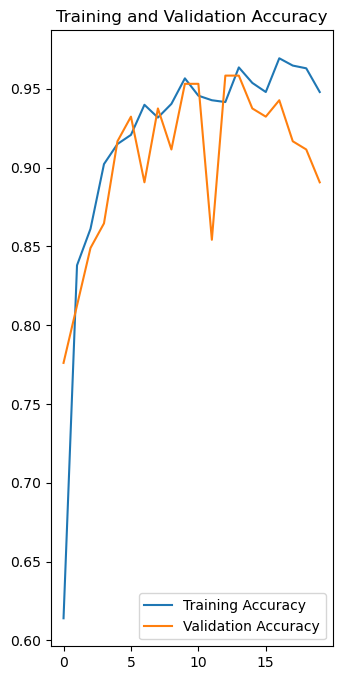

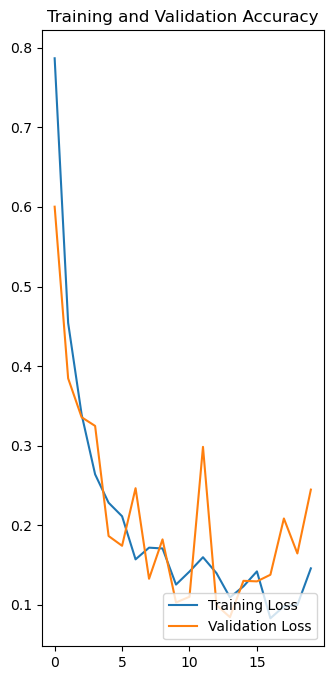

In [64]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS),acc,label='Training Accuracy')
plt.plot(range(EPOCHS),val_acc,label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.show()

plt.figure(figsize=(8,8))
plt.subplot(1,2,2)
plt.plot(range(EPOCHS),loss,label='Training Loss')
plt.plot(range(EPOCHS),val_loss,label='Validation Loss')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.show()

first image to prdict
actual label :  Potato___healthy
predicted label :  Potato___healthy


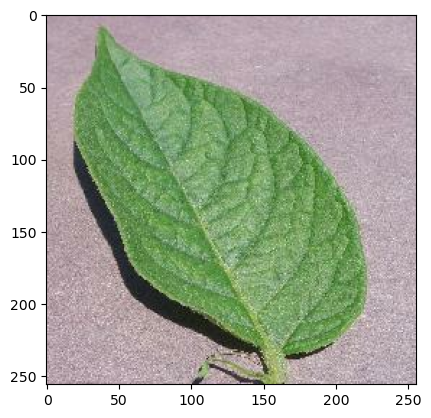

In [116]:
for images_batch,labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print('first image to prdict')
    plt.imshow(first_image)
    print('actual label : ',class_names[first_label])
    
    batch_prediction = model.predict([images_batch])
    print('predicted label : ',class_names[np.argmax(batch_prediction[0])])
    plt.show()
    
    

In [92]:
def predict(model,img):
    
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array,0)
    
    predictions = model.predict(img_array)
    
    predicted_class=class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])),2)
    return predicted_class, confidence

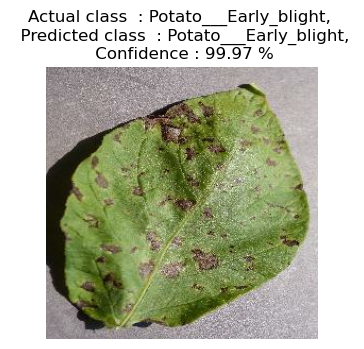

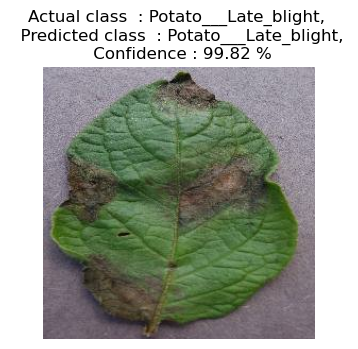

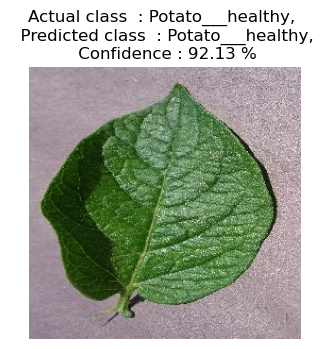

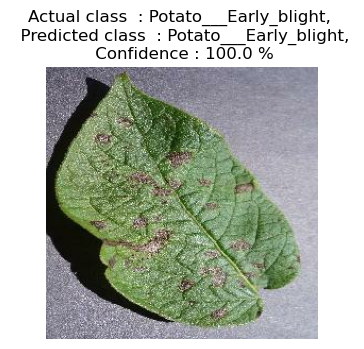

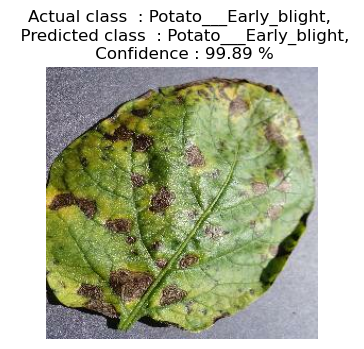

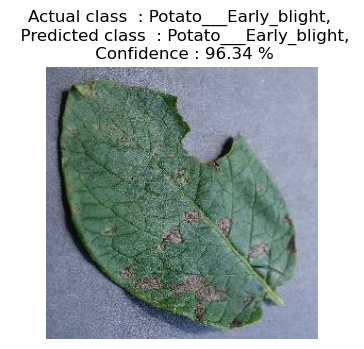

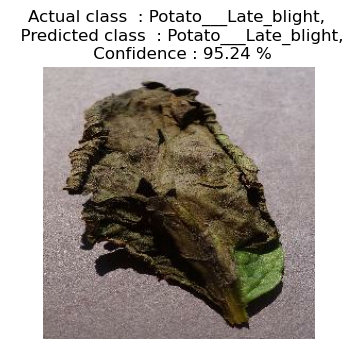

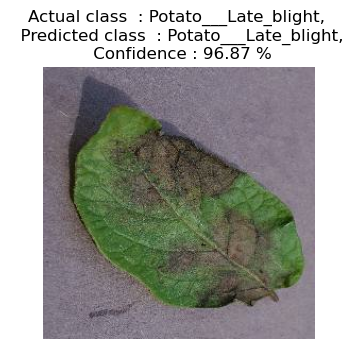

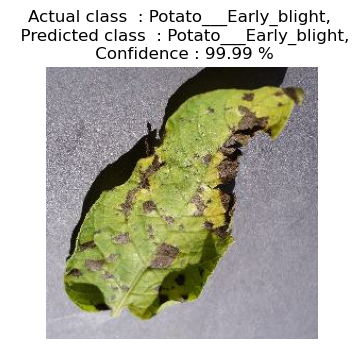

In [101]:


for images,labels in test_ds.take(1):
    for i in range(9):
        plt.figure(figsize=(12,12))
        ax=plt.subplot(3,3,i+1)
        plt.imshow(images[i].numpy().astype('uint8'))
        
        predicted_class,confidence = predict(model,images[i].numpy())
        actual_class = class_names[labels[i]]
        
        plt.title(f"Actual class  : {actual_class}, \n  Predicted class  : {predicted_class}, \n Confidence : {confidence} %")
        plt.axis('off')
        plt.show()

In [111]:
# we conduct some experiments may be remove data augementaion,chane model architecture & want to export 2 or 3 different 
# versions of model that to can try out


model_version=1
model.save(f"./models/{model_version}")

INFO:tensorflow:Assets written to: ./models/1\assets
INFO:tensorflow:Assets written to: ./models/2\assets


In [ ]:
model_version=2
model.save(f"./models/{model_version}")

In [112]:
import os 
os.listdir('./models')

['1', '2']

In [113]:
#auto increment
#model_version=max([int(i) for i in os.listdir('./models')+[0]])+1
#model.save(f"./models/{model_version}")
